## Dance move prediction using Multilayer Perceptron (MLP) - Approach 2

#### Summary:
- Average accuracy after 5 fold cross validation: 99.6% if using 28k parameters or 98.7% if using only 14k parameters
- Library used: Keras (TensorFlow)
- Dataset from individual dance move is segmented based on the highest data sample series among them and their corresponding label is chosen by mode. The segmented dataset is then reshaped into 3 dimensional array and flattened for MLP training
- No manual feature extraction - MLP trains and extracts features from unprocessed raw data
- <font color=blue>**Average convergence time is around 25 times faster than CNN**</color>

In [72]:
import numpy as np 
import pandas as pd 
import os
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
import sklearn.neural_network as nn
import pickle
from glob import glob
from timeit import default_timer as timer
import sys
from GraphingAndTransfer.extractDataset import *
import scipy.stats as stats

from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, KFold, StratifiedKFold, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier as knn
from sklearn.metrics import accuracy_score, classification_report
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from tune_sklearn import TuneGridSearchCV

from keras.utils import np_utils,to_categorical
from keras.optimizers import RMSprop, Adam
from keras.models import Sequential
from keras.layers import Flatten, Dense, Dropout, BatchNormalization, Conv1D, Conv2D, MaxPooling2D, MaxPooling1D
from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping
from keras import optimizers

from sklearn.metrics import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix
# plt.style.use('bmh')

file_path = "GraphingAndTransfer/processed/*"

pd.set_option("display.max_rows", None, "display.max_columns", None)
np.set_printoptions(threshold=100000) # 'sys.maxsize' for max

### Define segmentation window

In [49]:
NUMBER_OF_AFTER_SAMPLES = 8 #Number of samples to include in dance move after end detected
NUMBER_OF_BEFORE_SAMPLES = 8 #Number of samples to include in dance move before start detected
MINIMUM_MOVE_TIME = 20 #Minimum number of samples to be considered a move. Set this too low and you will get garbage dance samples

In [50]:
danceMoveDataset = processData(NUMBER_OF_AFTER_SAMPLES, NUMBER_OF_BEFORE_SAMPLES, MINIMUM_MOVE_TIME)

Recording from dev2 with move pointhigh at 16152387977925 opened with 685 samples
Recording from dev2 with move hair at 16152385941495 opened with 898 samples
Recording from dev2 with move dab at 16152380133389 opened with 786 samples
Recording from dev2 with move pointhigh at 16152388450418 opened with 188 samples
Recording from dev2 with move listen at 16152386837158 opened with 703 samples
Recording from dev2 with move gun at 16152384604594 opened with 903 samples
Recording from dev2 with move elbowkick at 16152382981181 opened with 1498 samples
Recording from dev2 with move sidepump at 16152389923805 opened with 754 samples
Recording from dev2 with move wipetable at 16152391069694 opened with 881 samples
Done
Extracted 87 moves from 9 raw data Sequences.
10  dab
10  elbowkick
12  gun
11  hair
12  listen
11  pointhigh
10  sidepump
11  wipetable
0  defaultMove


### Visualise each move sample in the segmentation window defined above

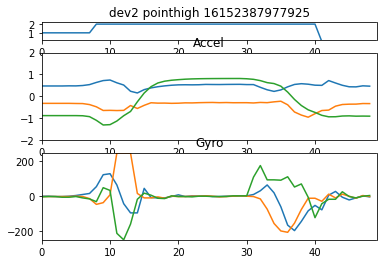

<Figure size 432x288 with 0 Axes>

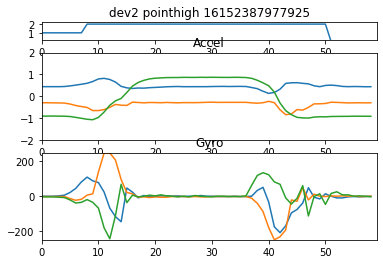

<Figure size 432x288 with 0 Axes>

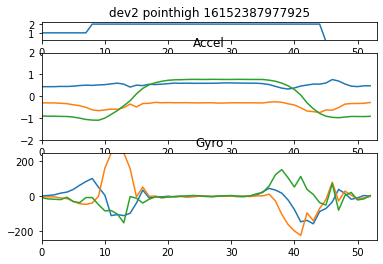

<Figure size 432x288 with 0 Axes>

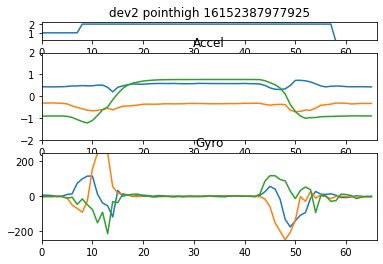

<Figure size 432x288 with 0 Axes>

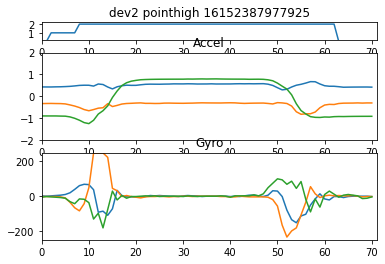

<Figure size 432x288 with 0 Axes>

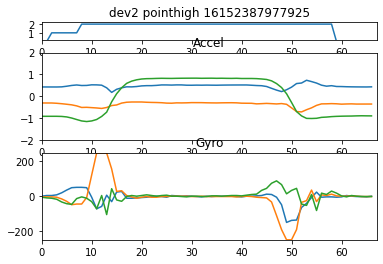

<Figure size 432x288 with 0 Axes>

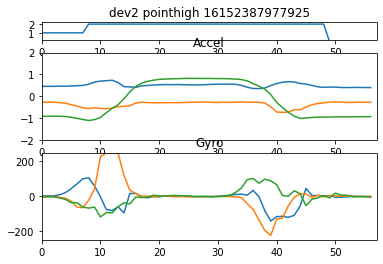

<Figure size 432x288 with 0 Axes>

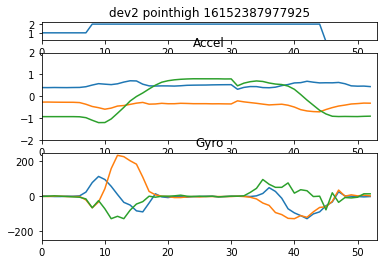

<Figure size 432x288 with 0 Axes>

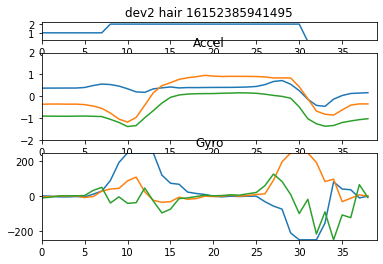

<Figure size 432x288 with 0 Axes>

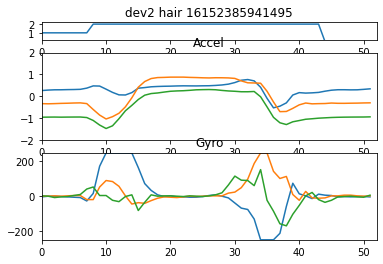

<Figure size 432x288 with 0 Axes>

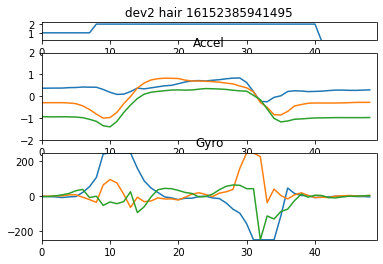

<Figure size 432x288 with 0 Axes>

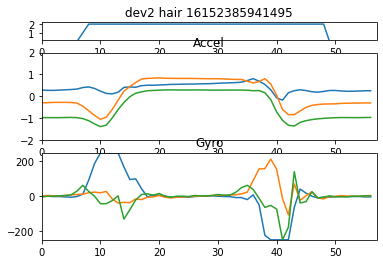

<Figure size 432x288 with 0 Axes>

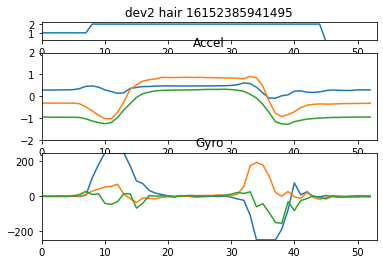

<Figure size 432x288 with 0 Axes>

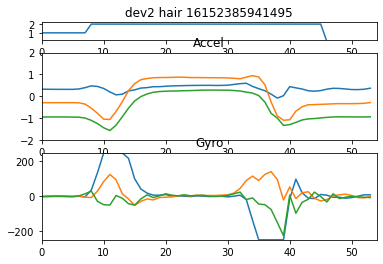

<Figure size 432x288 with 0 Axes>

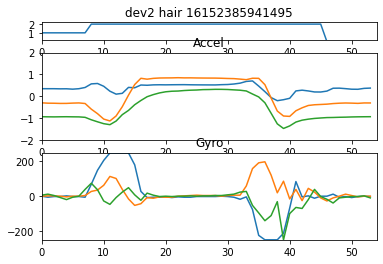

<Figure size 432x288 with 0 Axes>

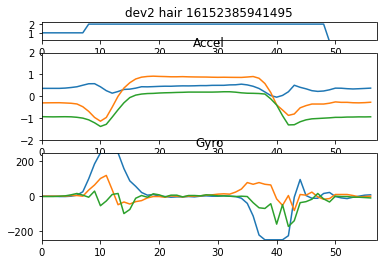

<Figure size 432x288 with 0 Axes>

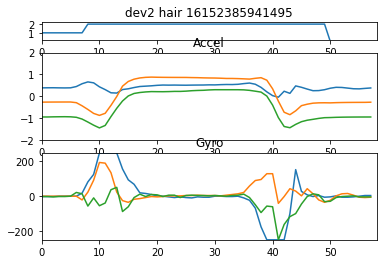

<Figure size 432x288 with 0 Axes>

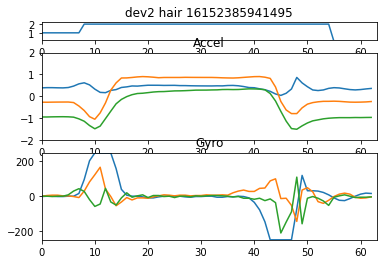

<Figure size 432x288 with 0 Axes>

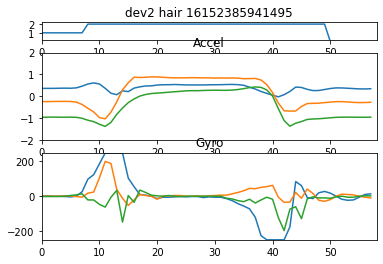

<Figure size 432x288 with 0 Axes>

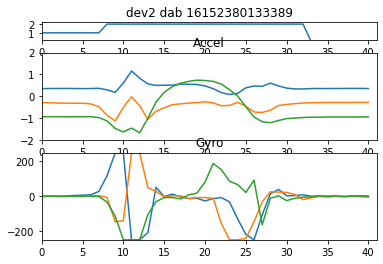

<Figure size 432x288 with 0 Axes>

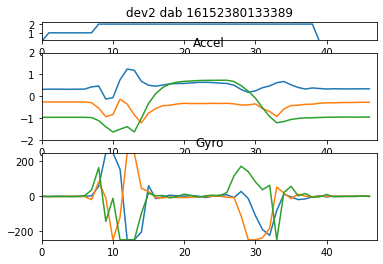

<Figure size 432x288 with 0 Axes>

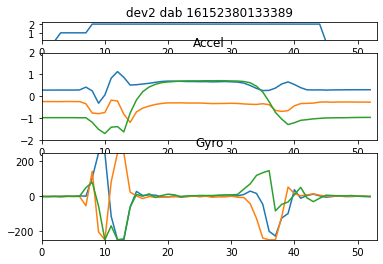

<Figure size 432x288 with 0 Axes>

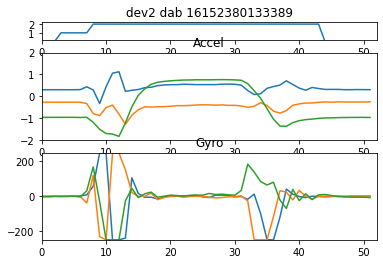

<Figure size 432x288 with 0 Axes>

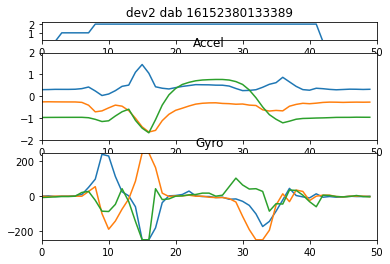

<Figure size 432x288 with 0 Axes>

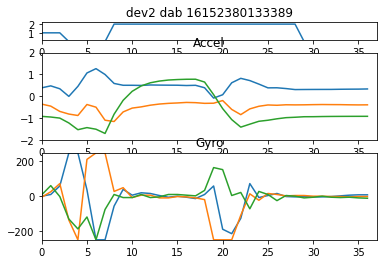

<Figure size 432x288 with 0 Axes>

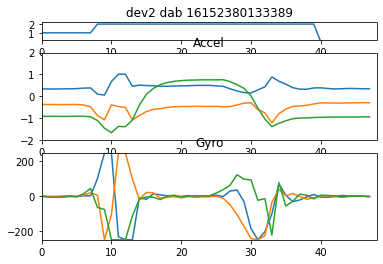

<Figure size 432x288 with 0 Axes>

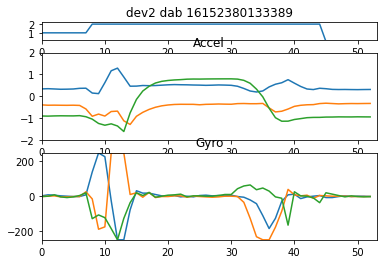

<Figure size 432x288 with 0 Axes>

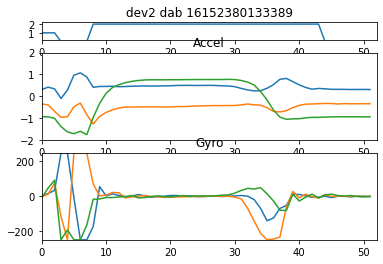

<Figure size 432x288 with 0 Axes>

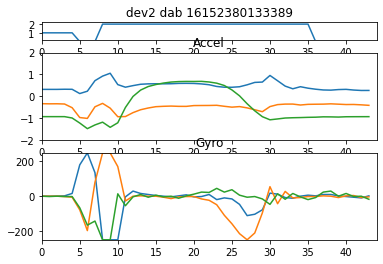

<Figure size 432x288 with 0 Axes>

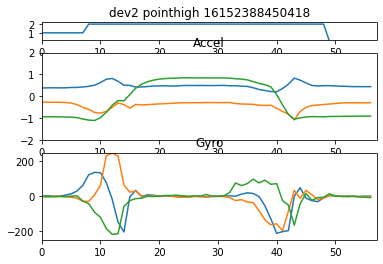

<Figure size 432x288 with 0 Axes>

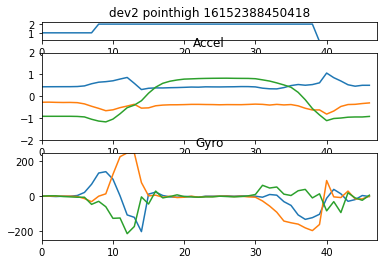

<Figure size 432x288 with 0 Axes>

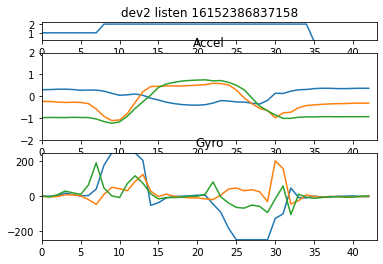

<Figure size 432x288 with 0 Axes>

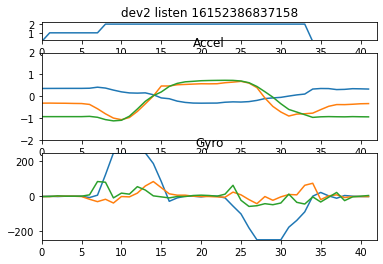

<Figure size 432x288 with 0 Axes>

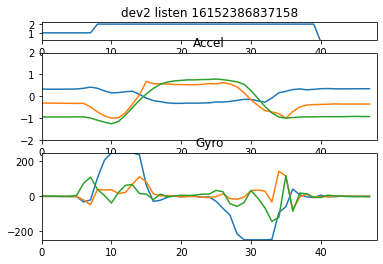

<Figure size 432x288 with 0 Axes>

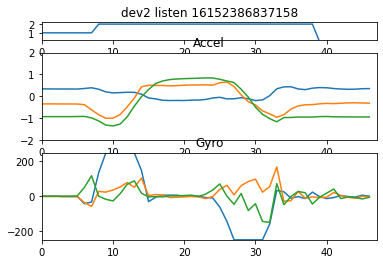

<Figure size 432x288 with 0 Axes>

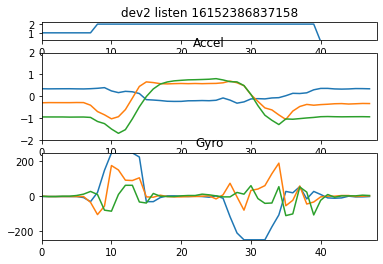

<Figure size 432x288 with 0 Axes>

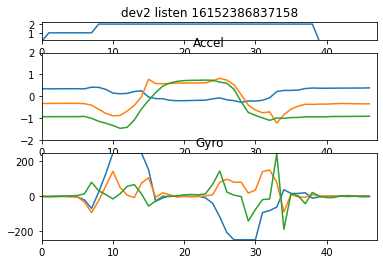

<Figure size 432x288 with 0 Axes>

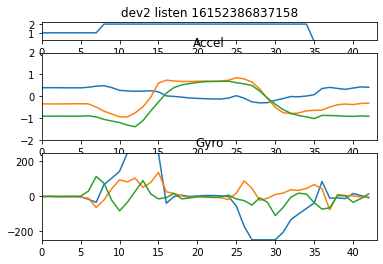

<Figure size 432x288 with 0 Axes>

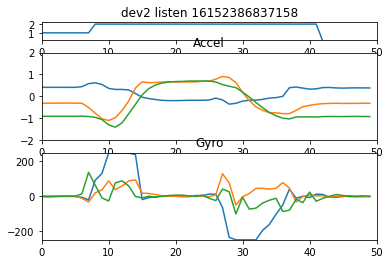

<Figure size 432x288 with 0 Axes>

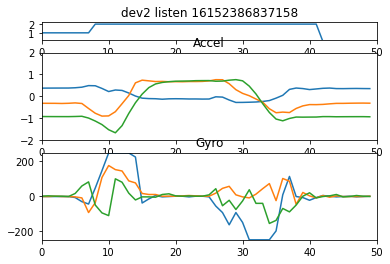

<Figure size 432x288 with 0 Axes>

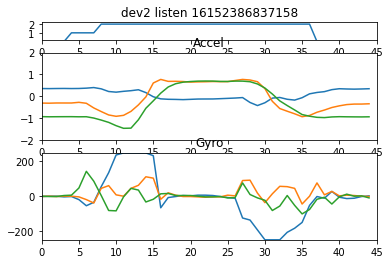

<Figure size 432x288 with 0 Axes>

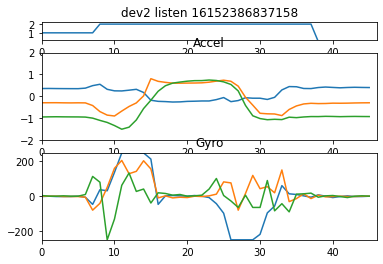

<Figure size 432x288 with 0 Axes>

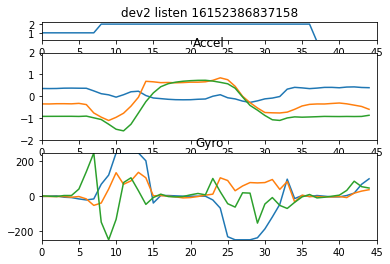

<Figure size 432x288 with 0 Axes>

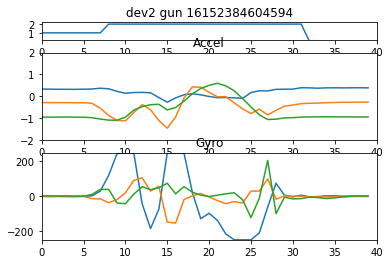

<Figure size 432x288 with 0 Axes>

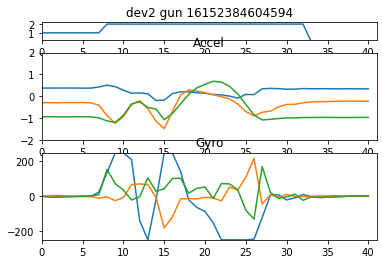

<Figure size 432x288 with 0 Axes>

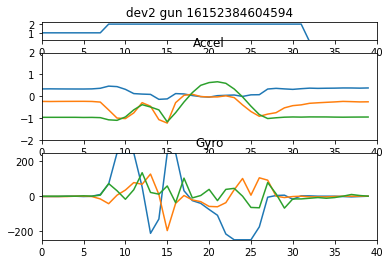

<Figure size 432x288 with 0 Axes>

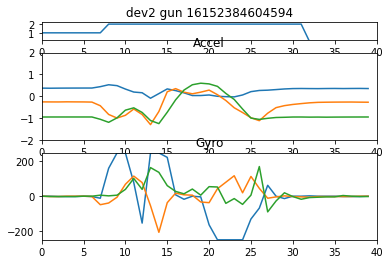

<Figure size 432x288 with 0 Axes>

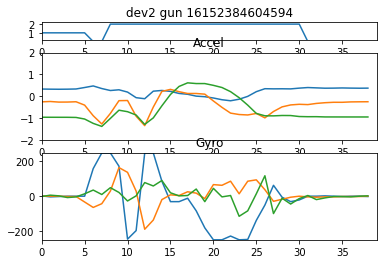

<Figure size 432x288 with 0 Axes>

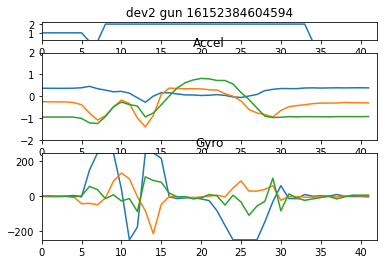

<Figure size 432x288 with 0 Axes>

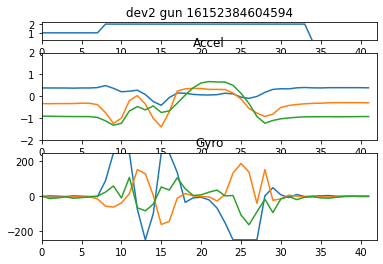

<Figure size 432x288 with 0 Axes>

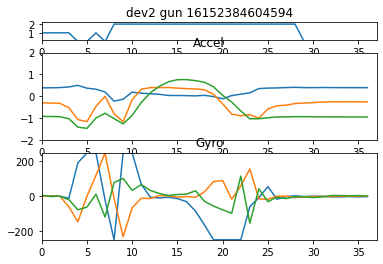

<Figure size 432x288 with 0 Axes>

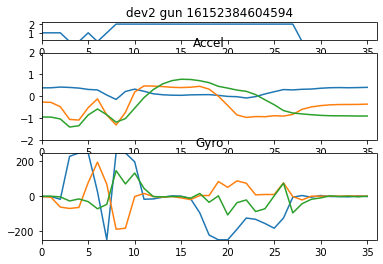

<Figure size 432x288 with 0 Axes>

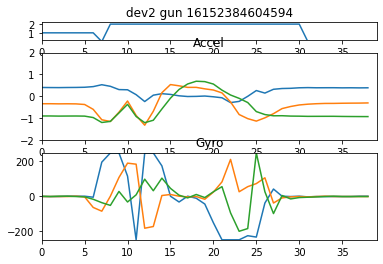

<Figure size 432x288 with 0 Axes>

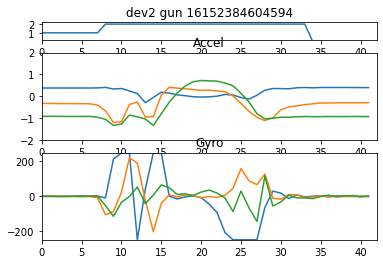

<Figure size 432x288 with 0 Axes>

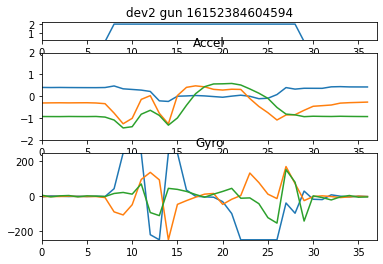

<Figure size 432x288 with 0 Axes>

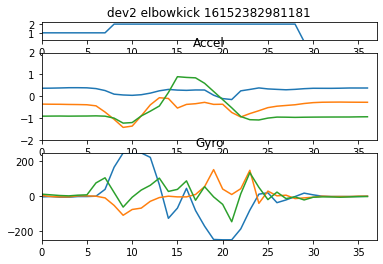

<Figure size 432x288 with 0 Axes>

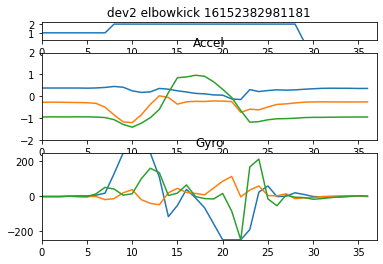

<Figure size 432x288 with 0 Axes>

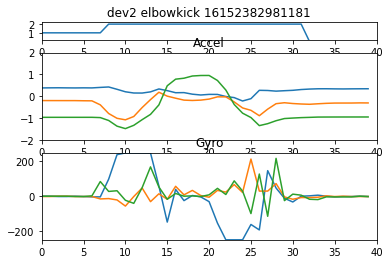

<Figure size 432x288 with 0 Axes>

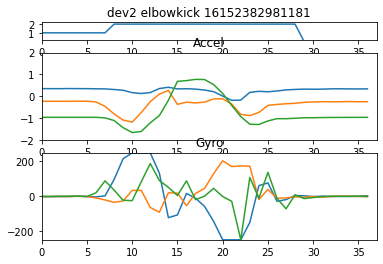

<Figure size 432x288 with 0 Axes>

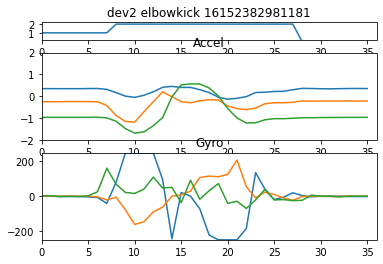

<Figure size 432x288 with 0 Axes>

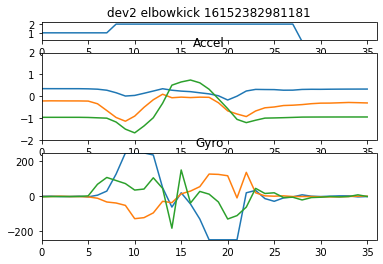

<Figure size 432x288 with 0 Axes>

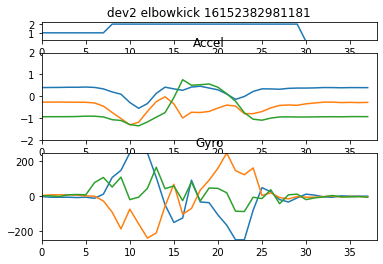

<Figure size 432x288 with 0 Axes>

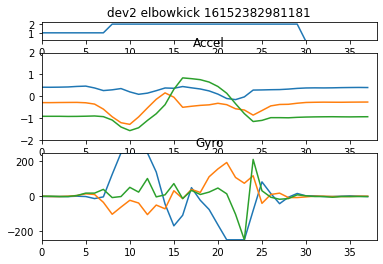

<Figure size 432x288 with 0 Axes>

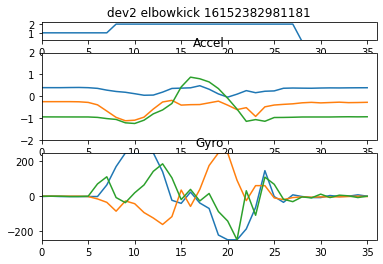

<Figure size 432x288 with 0 Axes>

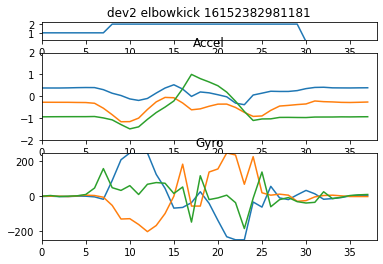

<Figure size 432x288 with 0 Axes>

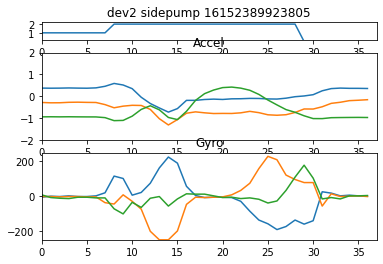

<Figure size 432x288 with 0 Axes>

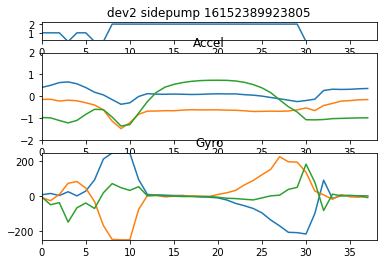

<Figure size 432x288 with 0 Axes>

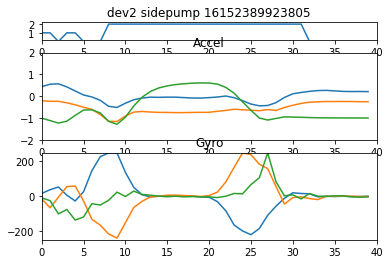

<Figure size 432x288 with 0 Axes>

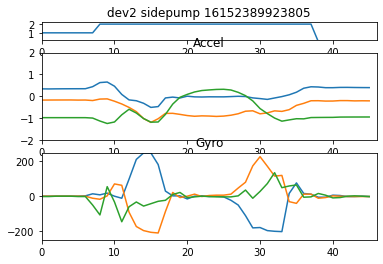

<Figure size 432x288 with 0 Axes>

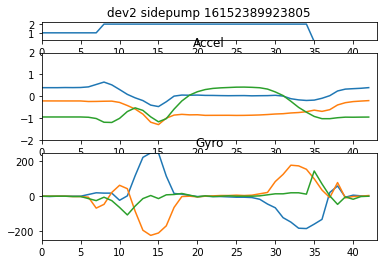

<Figure size 432x288 with 0 Axes>

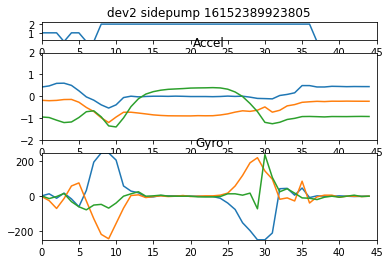

<Figure size 432x288 with 0 Axes>

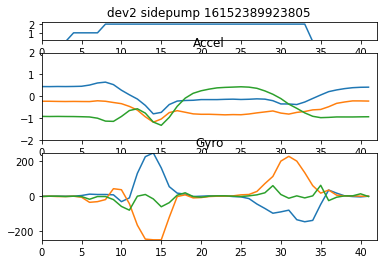

<Figure size 432x288 with 0 Axes>

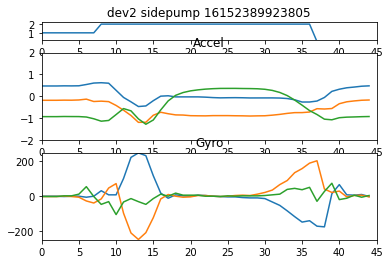

<Figure size 432x288 with 0 Axes>

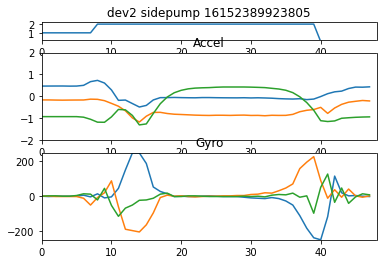

<Figure size 432x288 with 0 Axes>

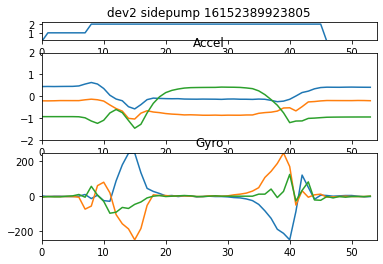

<Figure size 432x288 with 0 Axes>

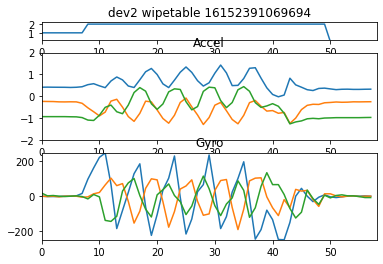

<Figure size 432x288 with 0 Axes>

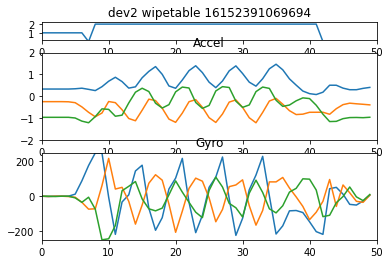

<Figure size 432x288 with 0 Axes>

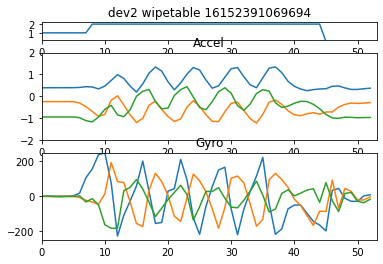

<Figure size 432x288 with 0 Axes>

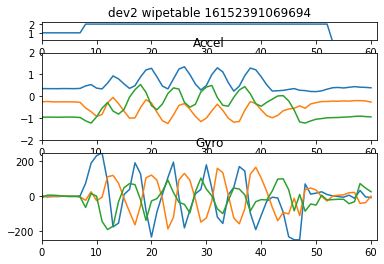

<Figure size 432x288 with 0 Axes>

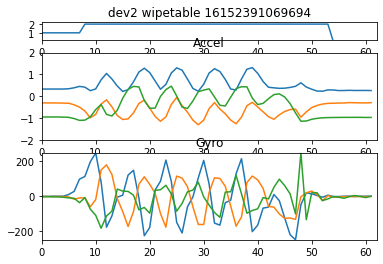

<Figure size 432x288 with 0 Axes>

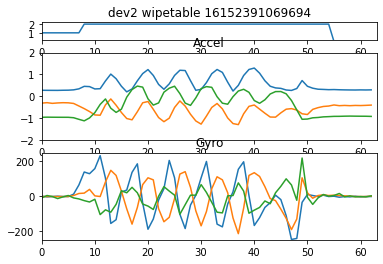

<Figure size 432x288 with 0 Axes>

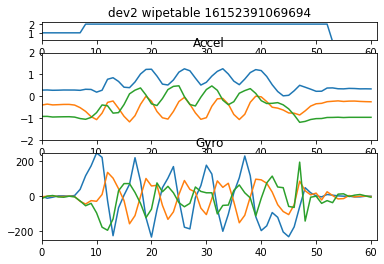

<Figure size 432x288 with 0 Axes>

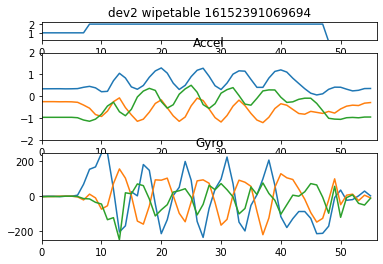

<Figure size 432x288 with 0 Axes>

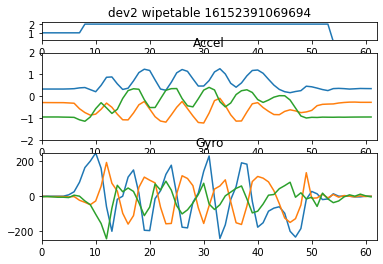

<Figure size 432x288 with 0 Axes>

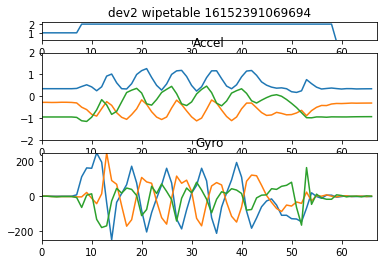

<Figure size 432x288 with 0 Axes>

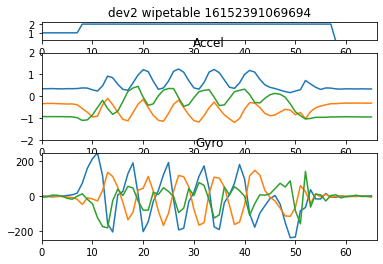

<Figure size 432x288 with 0 Axes>

In [4]:
for i in range (1, len(danceMoveDataset)):
    danceMoveDataset[i].plot()

### Number of series of samples in each move, based on the segmentation window defined above.

In [51]:
folder_path = "GraphingAndTransfer/processed/"
noOfSamples = []
for text_file in sorted(os.listdir(folder_path)):
    print("Processing:", text_file)
    
    with open(folder_path+text_file, 'r') as f:
        file = f.readlines()[1:]
    print("Number of series of samples in this move =", np.asarray(file).shape[0], "\n")
    
    noOfSamples.append(np.asarray(file).shape[0])

Processing: dev2_dab_16152380133389_19
Number of series of samples in this move = 38 

Processing: dev2_dab_16152380133389_20
Number of series of samples in this move = 41 

Processing: dev2_dab_16152380133389_21
Number of series of samples in this move = 47 

Processing: dev2_dab_16152380133389_22
Number of series of samples in this move = 53 

Processing: dev2_dab_16152380133389_23
Number of series of samples in this move = 52 

Processing: dev2_dab_16152380133389_24
Number of series of samples in this move = 50 

Processing: dev2_dab_16152380133389_25
Number of series of samples in this move = 37 

Processing: dev2_dab_16152380133389_26
Number of series of samples in this move = 48 

Processing: dev2_dab_16152380133389_27
Number of series of samples in this move = 53 

Processing: dev2_dab_16152380133389_28
Number of series of samples in this move = 52 

Processing: dev2_dab_16152380133389_29
Number of series of samples in this move = 44 

Processing: dev2_elbowkick_16152382981181_5

### Find the minimum and maximum number of samples in all captured moves

In [52]:
min_n_samples = min(noOfSamples)
max_n_samples = max(noOfSamples)
print("Minimum: {} \nMaximum: {}" .format(min_n_samples, max_n_samples))

Minimum: 36 
Maximum: 71


### Selecting only the first 36 series of samples in each move and append in to a dataframe in order

In [53]:
columns = ['acc_X','acc_Y','acc_Z','gyro_X','gyro_Y','gyro_Z','Stage', 'Activity']
combined_raw = pd.DataFrame(columns = columns)

In [54]:
folder_path = "GraphingAndTransfer/processed/"
for text_file in sorted(os.listdir(folder_path)):
    print("Processing:", text_file)
    
    with open(folder_path+text_file, 'r') as f:
        file = f.readlines()[1:]
        
    temp_list = []
    
    for line in file:
        temp_list.append([float(value) for value in line.split(',')])
    
    print("Shape =", np.asarray(temp_list).shape, "\n")

    # file_path_name = os.path.splitext(text_file)[0]
    # activity_labels = file_path_name.split('_')[1]

    activity_labels = text_file.split('_')[1]
        
    raw_data = np.array(temp_list)
        
    df_raw = pd.DataFrame(data = raw_data, columns = ['acc_X','acc_Y','acc_Z','gyro_X','gyro_Y','gyro_Z','Stage'])
    df_raw['Activity'] = activity_labels
    combined_raw = combined_raw.append(df_raw)

combined_raw.reset_index(drop=True, inplace=True)

Processing: dev2_dab_16152380133389_19
Shape = (38, 7) 

Processing: dev2_dab_16152380133389_20
Shape = (41, 7) 

Processing: dev2_dab_16152380133389_21
Shape = (47, 7) 

Processing: dev2_dab_16152380133389_22
Shape = (53, 7) 

Processing: dev2_dab_16152380133389_23
Shape = (52, 7) 

Processing: dev2_dab_16152380133389_24
Shape = (50, 7) 

Processing: dev2_dab_16152380133389_25
Shape = (37, 7) 

Processing: dev2_dab_16152380133389_26
Shape = (48, 7) 

Processing: dev2_dab_16152380133389_27
Shape = (53, 7) 

Processing: dev2_dab_16152380133389_28
Shape = (52, 7) 

Processing: dev2_dab_16152380133389_29
Shape = (44, 7) 

Processing: dev2_elbowkick_16152382981181_56
Shape = (37, 7) 

Processing: dev2_elbowkick_16152382981181_57
Shape = (37, 7) 

Processing: dev2_elbowkick_16152382981181_58
Shape = (40, 7) 

Processing: dev2_elbowkick_16152382981181_59
Shape = (37, 7) 

Processing: dev2_elbowkick_16152382981181_60
Shape = (36, 7) 

Processing: dev2_elbowkick_16152382981181_61
Shape = (36, 

In [9]:
combined_raw

,acc_X,acc_Y,acc_Z,gyro_X,gyro_Y,gyro_Z,Stage,Activity
0,0.347305,-0.299063,-0.941626,-1.953125,-1.953125,0.000000,1.0,dab
1,0.352133,-0.304438,-0.939976,0.000000,0.000000,0.000000,1.0,dab
2,0.355030,-0.313913,-0.938985,0.000000,1.953125,-1.953125,1.0,dab
3,0.356768,-0.319598,-0.944641,1.953125,0.000000,-1.953125,1.0,dab
4,0.351561,-0.323009,-0.941785,3.906250,-1.953125,0.000000,1.0,dab
5,0.348436,-0.325055,-0.940071,5.859375,-1.953125,0.000000,1.0,dab
6,0.352812,-0.351283,-0.939043,7.812500,0.000000,0.000000,1.0,dab
7,0.361687,-0.485770,-0.982176,27.343750,3.906250,-1.953125,1.0,dab
8,0.292012,-0.872712,-1.133055,117.187500,-7.812500,-33.203125,2.0,dab
9,0.175207,-1.136127,-1.479833,248.046875,-146.484375,-115.234375,2.0,dab


In [55]:
X = combined_raw.iloc[:,:-2]
y = combined_raw.iloc[:, -1]

In [11]:
X

,acc_X,acc_Y,acc_Z,gyro_X,gyro_Y,gyro_Z
0,0.347305,-0.299063,-0.941626,-1.953125,-1.953125,0.000000
1,0.352133,-0.304438,-0.939976,0.000000,0.000000,0.000000
2,0.355030,-0.313913,-0.938985,0.000000,1.953125,-1.953125
3,0.356768,-0.319598,-0.944641,1.953125,0.000000,-1.953125
4,0.351561,-0.323009,-0.941785,3.906250,-1.953125,0.000000
5,0.348436,-0.325055,-0.940071,5.859375,-1.953125,0.000000
6,0.352812,-0.351283,-0.939043,7.812500,0.000000,0.000000
7,0.361687,-0.485770,-0.982176,27.343750,3.906250,-1.953125
8,0.292012,-0.872712,-1.133055,117.187500,-7.812500,-33.203125
9,0.175207,-1.136127,-1.479833,248.046875,-146.484375,-115.234375


### Choose <code>max_n_samples</code>  for segmenting a window

In [56]:
Fs = 10 # sampling freq
frame_size = max_n_samples
sliding_overlap = Fs*2 # 50% overlap

In [57]:
def get_frames(df, frame_size, sliding_overlap):

    N_FEATURES = 6 # number of features

    frames = []
    labels = []
    for i in range(0, len(df) - frame_size):
        acc_X = df['acc_X'].values[i: i + frame_size]
        acc_Y = df['acc_Y'].values[i: i + frame_size]
        acc_Z = df['acc_Z'].values[i: i + frame_size]
        gyro_X = df['gyro_X'].values[i: i + frame_size]
        gyro_Y = df['gyro_Y'].values[i: i + frame_size]
        gyro_Z = df['gyro_Z'].values[i: i + frame_size]
        
        # Select the label that appears the most often in this segment
        label = stats.mode(df['Activity'][i: i + frame_size])[0][0]
        frames.append([acc_X, acc_Y, acc_Z, gyro_X, gyro_Y, gyro_Z])
        labels.append(label)

    frames = np.asarray(frames).reshape(-1, N_FEATURES, frame_size)
    labels = np.asarray(labels, dtype=object)

    return frames, labels

In [58]:
X, y = get_frames(combined_raw, frame_size, sliding_overlap)

In [59]:
X.shape

(5343, 6, 71)

In [16]:
X

array([[[  0.34730522,   0.35213313,   0.35502988, ...,   0.37041103,
           0.33474662,   0.33209797],
        [ -0.29906258,  -0.30443755,  -0.31391253, ...,  -0.37616601,
          -0.34444961,  -0.31291976],
        [ -0.94162629,  -0.93997577,  -0.93898546, ...,  -1.02649388,
          -1.00339633,  -0.9770378 ],
        [ -1.953125  ,   0.        ,   0.        , ...,   1.953125  ,
           3.90625   ,   7.8125    ],
        [ -1.953125  ,   0.        ,   1.953125  , ...,  21.484375  ,
           9.765625  , -19.53125   ],
        [  0.        ,   0.        ,  -1.953125  , ..., -25.390625  ,
         -11.71875   ,  -5.859375  ]],

       [[  0.35213313,   0.35502988,   0.35676793, ...,   0.33474662,
           0.33209797,   0.34925878],
        [ -0.30443755,  -0.31391253,  -0.31959752, ...,  -0.34444961,
          -0.31291976,  -0.30025186],
        [ -0.93997577,  -0.93898546,  -0.94464128, ...,  -1.00339633,
          -0.9770378 ,  -0.96122268],
        [  0.        ,   0

In [17]:
y

array(['dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab',
       'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab',
       'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab',
       'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab',
       'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab',
       'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab',
       'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab',
       'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab',
       'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab',
       'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab',
       'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab',
       'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab',
       'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab',
       'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab', 'dab',
       'dab', 'dab',

In [60]:
encoder = preprocessing.LabelEncoder()
encoder.fit(y)
y = encoder.fit_transform(y)

In [19]:
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [61]:
encoder.classes_

array(['dab', 'elbowkick', 'gun', 'hair', 'listen', 'pointhigh',
       'sidepump', 'wipetable'], dtype=object)

### Search for optimal hyperparameters using Tune Search (https://github.com/ray-project/tune-sklearn)

In [62]:
# Bad: always exceed epoch limit without convergence. To be considered in future.
def tuneSearch():
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=None, shuffle=True)

    mlp_adam = nn.MLPClassifier(solver='adam', early_stopping=True, batch_size=32)
    
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    tune_parameters = {
        'hidden_layer_sizes': [(100,200), (150,200), (200, 150), (50, 200, 3)],
        'activation': ['tanh', 'relu'],
        'solver': ['adam'],
        'alpha': [1e-4, 1e-1, 0.05],
        'epsilon':[0.01, 0.1]
    }
    
    tune_search = TuneGridSearchCV(
        mlp_adam,
        tune_parameters,
        early_stopping=True,
        max_iters=10
    )
    
    tune_search.fit(X_train, y_train)
    pred = tune_search.predict(X_test)
    accuracy = np.count_nonzero(np.array(pred) == np.array(y_test)) / len(pred)
    print("Tune Accuracy:", accuracy)
    print(tune_search.best_params_)

### Search for optimal hyperparameters using GridSearchCV

In [ ]:
def GSCV():
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=None, shuffle=True)

    mlp_adam = nn.MLPClassifier(solver='adam', early_stopping=True, batch_size=minSamples)
    
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
#     print('X_train:', X_train)
#     print('X_test:', X_test)
#     print('y_train:', y_train)
#     print('y_test:', y_test)

    parameter_space = {
        'hidden_layer_sizes': [(100,200), (150,200), (200, 150), (50,200,3),
                               (50,100,50), (100,), (200,), (300,), (400,)],
        'activation': ['tanh', 'relu'],
        'alpha': [0.0001, 0.001, 0.05],
        'tol': [1e-4, 1e-5, 1e-6]        
    }
    
        
    clf = GridSearchCV(mlp_adam, parameter_space, scoring='accuracy', n_jobs=-1, cv=3, verbose=3)
    clf.fit(X_train, y_train)
        
    print('Best parameters found:\n', clf.best_params_)

#     # All results
#     means = clf.cv_results_['mean_test_score']
#     stds = clf.cv_results_['std_test_score']
#     for mean, std, params in zip(means, stds, clf.cv_results_['params']):
#         print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))
        
    mlp_pred = clf.predict(X_test)
    
    print('Results on the test set:')
    print(classification_report(y_test, mlp_pred, target_names=encoder.classes_))

In [ ]:
GSCV()

#### Note the optimal hyperparameters found above are just indicative

## MLP Training

In [63]:
train_histories = []
cm_hist = []
classification_report_hist = []

In [76]:
def perform_mlp(fold, pca):
    start_time = timer()
    k = fold
    perform_pca = pca
    kf = KFold(n_splits=k, shuffle=True)
    #kf = StratifiedKFold(n_splits=k, shuffle=True)

    
# # Trial 3: ave accuracy 81%
#     mlp_adam = nn.MLPClassifier(hidden_layer_sizes=(200, 150), max_iter=500, activation='tanh', solver='adam',
#                                       batch_size = minSamples, validation_fraction=0.2, n_iter_no_change=20,
#                                       alpha=1e-4, early_stopping=True, verbose=0, tol=1e-6, random_state=None, 
#                                       learning_rate_init=0.001, shuffle=False) 

    acc_scores = []
    cv_iteration = 1
    cv_pca_iteration = 1
    train_histories.clear()
    cm_hist.clear()
    classification_report_hist.clear()
#     train_histories_mlp_sgd.clear()
#     train_histories_mlp_adam.clear()
    
    for train_index, test_index in kf.split(X):
        
        if perform_pca == False:
            print('\nTraining model and cross validate using fold #{}...\n ' .format(cv_iteration))
            cv_iteration += 1
        
        X_train , X_test = X[train_index,:], X[test_index,:]
        y_train , y_test = y[train_index], y[test_index]
        
#         print('X_train shape:', X_train.shape)
#         print('X_test shape:', X_test.shape)

        y_test_without_transform = y_test

#         print('X_train before standard scaler: ', X_train)
#         print('X_test before standard scaler: ', X_test)        
        
#         scaler = StandardScaler()
#         X_train = scaler.fit_transform(X_train)
#         X_test = scaler.transform(X_test)
        
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train.reshape(-1, X_train.shape[-1])).reshape(X_train.shape)
        X_test = scaler.transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)
#         print('X_train shape:', X_train.shape)
#         print('X_test shape:', X_test.shape)        

        
        y_train = to_categorical(y_train, num_classes=8)
        y_test = to_categorical(y_test, num_classes=8)
        
        X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2], 1)
        X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2], 1)     
        
#         print('X_train shape:', X_train.shape)
#         print('X_test shape:', X_test.shape)
        
        if perform_pca == True:
            print('\nTraining model with PCA and cross validate using fold #{}...\n ' .format(cv_pca_iteration))
            cv_pca_iteration += 1
            pca = PCA(n_components = 4) # n=100 is the usual consensus in HAR
            X_train = pca.fit_transform(X_train)
            X_test = pca.transform(X_test)
            pca.explained_variance_ratio_

        def mlp_model():
            model = Sequential()
            model.add(Flatten(input_shape=X_train[0].shape))
            #model.add(Dense(units=64, kernel_initializer='uniform', activation='relu', input_shape=X_train[0].shape))
            model.add(Dense(units=64, kernel_initializer='uniform', activation='relu'))
            model.add(Dropout(0.2))
            model.add(Dense(units=16, kernel_initializer='uniform', activation='relu'))
#             model.add(Flatten())
            model.add(Dense(units=8, kernel_initializer='uniform', activation='softmax'))
            model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
            return model
        
        mlp = mlp_model()
        print(mlp.summary())        
        
        checkpoint_filepath="MLP_weights_checkpoint.hdf5"
                
        my_callbacks = [
            EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20),
            ReduceLROnPlateau(monitor='val_accuracy', factor=0.1, min_delta=0.00001, patience=20, verbose=1),
            ModelCheckpoint(filepath = checkpoint_filepath, save_weights_only=True, monitor='val_accuracy',
                            verbose=1, save_best_only=True, mode='max')  
        ] 
        
        history = mlp.fit(X_train, y_train, batch_size=64, epochs=200, validation_data=(X_test, y_test),
                                  callbacks=[my_callbacks])
        
        mlp_pred = np.argmax(mlp.predict(X_test), axis=-1)
        scores = mlp.evaluate(X_test, y_test, batch_size=64, verbose=0)
        acc_scores.append(scores[1])
        train_histories.append(history.history)
        
        mlp_weights = mlp.get_weights()
        print("MLP Weights:", mlp_weights)
        
        mlp.save('saved_models/MLP_99.6_accuracy')
        
        print('y_test\n', y_test_without_transform)
        print('')
        print('mlp_pred\n', mlp_pred)
        
        cm_hist.append(confusion_matrix(y_test_without_transform, mlp_pred))
        classification_report_hist.append(classification_report(y_test_without_transform, mlp_pred, target_names=encoder.classes_))
        

    end_time = timer()
    time_taken = end_time - start_time

    return acc_scores, time_taken

In [77]:
acc_scores, time_taken = perform_mlp(fold=5, pca=False)


Training model and cross validate using fold #1...
 
Model: "sequential_28"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_28 (Flatten)         (None, 426)               0         
_________________________________________________________________
dense_84 (Dense)             (None, 64)                27328     
_________________________________________________________________
dropout_28 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_85 (Dense)             (None, 16)                1040      
_________________________________________________________________
dense_86 (Dense)             (None, 8)                 136       
Total params: 28,504
Trainable params: 28,504
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/200
67/67 [==============================] - 0s 

67/67 [==============================] - 0s 2ms/step - loss: 0.0146 - accuracy: 0.9961 - val_loss: 0.0132 - val_accuracy: 0.9944

Epoch 00034: val_accuracy did not improve from 0.99719
Epoch 35/200
67/67 [==============================] - 0s 2ms/step - loss: 0.0147 - accuracy: 0.9979 - val_loss: 0.0143 - val_accuracy: 0.9953

Epoch 00035: val_accuracy did not improve from 0.99719
Epoch 36/200
67/67 [==============================] - 0s 2ms/step - loss: 0.0152 - accuracy: 0.9947 - val_loss: 0.0143 - val_accuracy: 0.9935

Epoch 00036: val_accuracy did not improve from 0.99719
Epoch 37/200
67/67 [==============================] - 0s 2ms/step - loss: 0.0182 - accuracy: 0.9944 - val_loss: 0.0170 - val_accuracy: 0.9925

Epoch 00037: val_accuracy did not improve from 0.99719
Epoch 38/200
67/67 [==============================] - 0s 2ms/step - loss: 0.0131 - accuracy: 0.9955 - val_loss: 0.0108 - val_accuracy: 0.9981

Epoch 00038: val_accuracy improved from 0.99719 to 0.99813, saving model to ML

MLP Weights: [array([[-1.30245388e-01,  2.35829666e-01, -1.22681148e-02,
        -5.14330938e-02,  3.22186835e-02, -1.58067629e-01,
        -2.16693535e-01, -2.40825310e-01, -5.51443659e-02,
        -1.60668522e-01, -7.60903135e-02, -2.66715258e-01,
        -2.65833467e-01, -2.60276407e-01, -2.22485945e-01,
        -2.71922261e-01, -1.03356093e-01,  1.39755569e-02,
        -3.37310210e-02,  4.32970971e-02, -1.49370953e-01,
        -1.07120097e-01,  7.05637187e-02, -1.26802698e-01,
        -9.20339450e-02, -2.88243115e-01, -1.41718209e-01,
        -2.18006432e-01, -2.25346953e-01, -2.19657436e-01,
        -8.37544501e-02, -2.16705695e-01, -1.22062691e-01,
        -2.74468780e-01, -1.86314434e-01, -2.48851612e-01,
        -1.91360921e-01, -1.06663136e-02, -1.16462745e-01,
        -1.97626561e-01, -1.93284780e-01,  1.93181410e-01,
        -2.97107577e-01, -1.45954387e-02, -1.85781345e-01,
        -5.24009578e-02, -5.54077588e-02, -2.09801897e-01,
        -2.88719296e-01, -2.48037353e-01, 

INFO:tensorflow:Assets written to: saved_models/MLP_99.6_accuracy/assets
y_test
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 

67/67 [==============================] - 0s 1ms/step - loss: 0.0549 - accuracy: 0.9881 - val_loss: 0.0435 - val_accuracy: 0.9878

Epoch 00012: val_accuracy did not improve from 0.99065
Epoch 13/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0491 - accuracy: 0.9864 - val_loss: 0.0378 - val_accuracy: 0.9953

Epoch 00013: val_accuracy improved from 0.99065 to 0.99532, saving model to MLP_weights_checkpoint.hdf5
Epoch 14/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0493 - accuracy: 0.9847 - val_loss: 0.0425 - val_accuracy: 0.9888

Epoch 00014: val_accuracy did not improve from 0.99532
Epoch 15/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0542 - accuracy: 0.9828 - val_loss: 0.0359 - val_accuracy: 0.9925

Epoch 00015: val_accuracy did not improve from 0.99532
Epoch 16/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0353 - accuracy: 0.9918 - val_loss: 0.0346 - val_accuracy: 0.9860

Epoch 00016: val_accuracy did

67/67 [==============================] - 0s 1ms/step - loss: 0.0145 - accuracy: 0.9964 - val_loss: 0.0209 - val_accuracy: 0.9944

Epoch 00053: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.

Epoch 00053: val_accuracy did not improve from 0.99532
Epoch 54/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0078 - accuracy: 0.9992 - val_loss: 0.0209 - val_accuracy: 0.9944

Epoch 00054: val_accuracy did not improve from 0.99532
Epoch 55/200
67/67 [==============================] - 0s 2ms/step - loss: 0.0147 - accuracy: 0.9953 - val_loss: 0.0208 - val_accuracy: 0.9944

Epoch 00055: val_accuracy did not improve from 0.99532
Epoch 56/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0158 - accuracy: 0.9954 - val_loss: 0.0209 - val_accuracy: 0.9935

Epoch 00056: val_accuracy did not improve from 0.99532
Epoch 57/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0143 - accuracy: 0.9970 - val_loss: 0.0209 - val_accuracy: 0.99

INFO:tensorflow:Assets written to: saved_models/MLP_99.6_accuracy/assets
y_test
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 

67/67 [==============================] - 0s 2ms/step - loss: 0.0584 - accuracy: 0.9842 - val_loss: 0.0439 - val_accuracy: 0.9925

Epoch 00012: val_accuracy improved from 0.98690 to 0.99252, saving model to MLP_weights_checkpoint.hdf5
Epoch 13/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0548 - accuracy: 0.9880 - val_loss: 0.0410 - val_accuracy: 0.9897

Epoch 00013: val_accuracy did not improve from 0.99252
Epoch 14/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0546 - accuracy: 0.9868 - val_loss: 0.0392 - val_accuracy: 0.9916

Epoch 00014: val_accuracy did not improve from 0.99252
Epoch 15/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0475 - accuracy: 0.9853 - val_loss: 0.0379 - val_accuracy: 0.9897

Epoch 00015: val_accuracy did not improve from 0.99252
Epoch 16/200
67/67 [==============================] - 0s 2ms/step - loss: 0.0565 - accuracy: 0.9863 - val_loss: 0.0343 - val_accuracy: 0.9925

Epoch 00016: val_accuracy did

INFO:tensorflow:Assets written to: saved_models/MLP_99.6_accuracy/assets
y_test
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 

67/67 [==============================] - 0s 1ms/step - loss: 0.0624 - accuracy: 0.9844 - val_loss: 0.0437 - val_accuracy: 0.9953

Epoch 00012: val_accuracy improved from 0.99438 to 0.99532, saving model to MLP_weights_checkpoint.hdf5
Epoch 13/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0642 - accuracy: 0.9835 - val_loss: 0.0407 - val_accuracy: 0.9934

Epoch 00013: val_accuracy did not improve from 0.99532
Epoch 14/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0576 - accuracy: 0.9851 - val_loss: 0.0387 - val_accuracy: 0.9925

Epoch 00014: val_accuracy did not improve from 0.99532
Epoch 15/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0516 - accuracy: 0.9877 - val_loss: 0.0364 - val_accuracy: 0.9972

Epoch 00015: val_accuracy improved from 0.99532 to 0.99719, saving model to MLP_weights_checkpoint.hdf5
Epoch 16/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0465 - accuracy: 0.9874 - val_loss: 0.0284 - va


Epoch 00052: val_accuracy did not improve from 0.99719
Epoch 53/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0090 - accuracy: 0.9981 - val_loss: 0.0143 - val_accuracy: 0.9963

Epoch 00053: val_accuracy did not improve from 0.99719
Epoch 54/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0105 - accuracy: 0.9964 - val_loss: 0.0138 - val_accuracy: 0.9981

Epoch 00054: val_accuracy improved from 0.99719 to 0.99813, saving model to MLP_weights_checkpoint.hdf5
Epoch 55/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0127 - accuracy: 0.9957 - val_loss: 0.0136 - val_accuracy: 0.9972

Epoch 00055: val_accuracy did not improve from 0.99813
Epoch 56/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0144 - accuracy: 0.9962 - val_loss: 0.0133 - val_accuracy: 0.9981

Epoch 00056: val_accuracy did not improve from 0.99813
Epoch 57/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0077 - accuracy: 0.9993 - v

67/67 [==============================] - 0s 1ms/step - loss: 0.0081 - accuracy: 0.9983 - val_loss: 0.0129 - val_accuracy: 0.9972

Epoch 00093: val_accuracy did not improve from 0.99813
Epoch 94/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0094 - accuracy: 0.9974 - val_loss: 0.0129 - val_accuracy: 0.9972

Epoch 00094: ReduceLROnPlateau reducing learning rate to 1.0000000656873453e-06.

Epoch 00094: val_accuracy did not improve from 0.99813
Epoch 95/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0104 - accuracy: 0.9971 - val_loss: 0.0129 - val_accuracy: 0.9972

Epoch 00095: val_accuracy did not improve from 0.99813
Epoch 96/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0082 - accuracy: 0.9986 - val_loss: 0.0129 - val_accuracy: 0.9972

Epoch 00096: val_accuracy did not improve from 0.99813
Epoch 97/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0084 - accuracy: 0.9981 - val_loss: 0.0129 - val_accuracy: 0.99

INFO:tensorflow:Assets written to: saved_models/MLP_99.6_accuracy/assets
y_test
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 

67/67 [==============================] - 0s 1ms/step - loss: 0.0805 - accuracy: 0.9802 - val_loss: 0.0363 - val_accuracy: 0.9963

Epoch 00012: val_accuracy did not improve from 0.99625
Epoch 13/200
67/67 [==============================] - 0s 2ms/step - loss: 0.0698 - accuracy: 0.9804 - val_loss: 0.0334 - val_accuracy: 0.9944

Epoch 00013: val_accuracy did not improve from 0.99625
Epoch 14/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0581 - accuracy: 0.9829 - val_loss: 0.0297 - val_accuracy: 0.9953

Epoch 00014: val_accuracy did not improve from 0.99625
Epoch 15/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0593 - accuracy: 0.9812 - val_loss: 0.0263 - val_accuracy: 0.9963

Epoch 00015: val_accuracy did not improve from 0.99625
Epoch 16/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0482 - accuracy: 0.9876 - val_loss: 0.0240 - val_accuracy: 0.9963

Epoch 00016: val_accuracy did not improve from 0.99625
Epoch 17/200
67/67 [===

67/67 [==============================] - 0s 1ms/step - loss: 0.0102 - accuracy: 0.9970 - val_loss: 0.0083 - val_accuracy: 0.9991

Epoch 00052: val_accuracy did not improve from 0.99906
Epoch 53/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0084 - accuracy: 0.9971 - val_loss: 0.0085 - val_accuracy: 0.9991

Epoch 00053: val_accuracy did not improve from 0.99906
Epoch 54/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0075 - accuracy: 0.9990 - val_loss: 0.0087 - val_accuracy: 0.9991

Epoch 00054: val_accuracy did not improve from 0.99906
Epoch 55/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0083 - accuracy: 0.9985 - val_loss: 0.0084 - val_accuracy: 0.9991

Epoch 00055: val_accuracy did not improve from 0.99906
Epoch 56/200
67/67 [==============================] - 0s 1ms/step - loss: 0.0075 - accuracy: 0.9974 - val_loss: 0.0079 - val_accuracy: 0.9991

Epoch 00056: val_accuracy did not improve from 0.99906
Epoch 57/200
67/67 [===

INFO:tensorflow:Assets written to: saved_models/MLP_99.6_accuracy/assets
y_test
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 

In [75]:
print('MLP ADAM - prediction accuracy of each fold:\n {}'.format(acc_scores))
print('')
print('MLP ADAM - average accuracy in 5-fold = {} with std. deviation {}' .format(np.mean(acc_scores), np.std(acc_scores)))
print('')
print('Time taken: {:.2f} seconds' .format(time_taken))

MLP ADAM - prediction accuracy of each fold:
 [0.9981290698051453, 0.9943872690200806, 0.9971936345100403, 0.9943820238113403, 0.9943820238113403]

MLP ADAM - average accuracy in 5-fold = 0.9956948041915894 with std. deviation 0.001632701704483369

Time taken: 49.09 seconds


### Confusion Matrix of each training fold

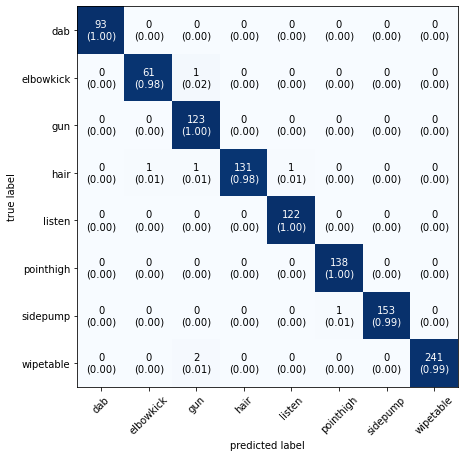

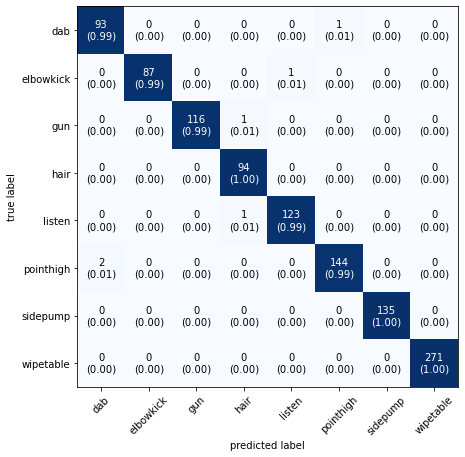

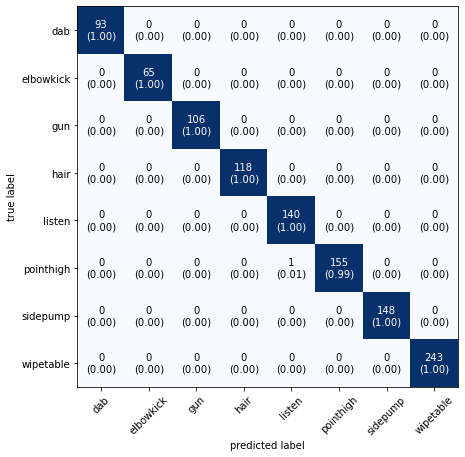

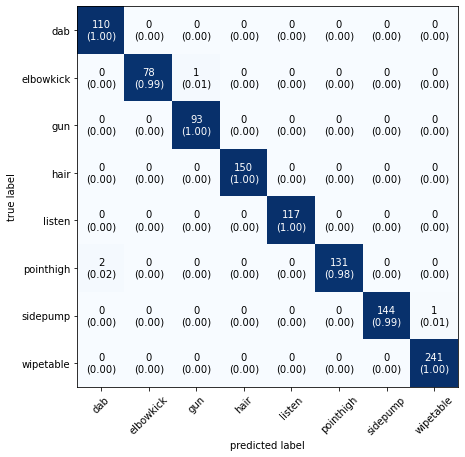

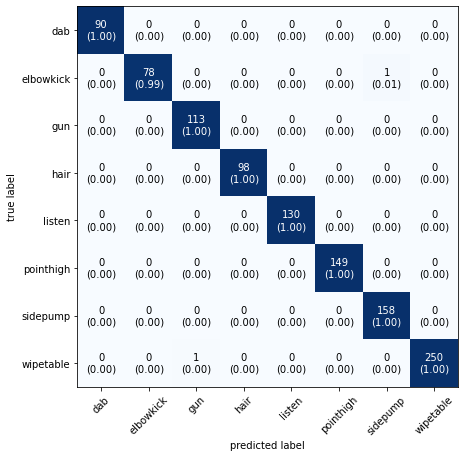

In [28]:
for i in range(5):
    plot_confusion_matrix(conf_mat=cm_hist[i], class_names=encoder.classes_, show_normed=True, 
                          figsize=(7,7), hide_spines=False)

### Classification Report of each training fold

In [29]:
for i in range(5):
    print("\nClassification Report for fold {}:" .format(i+1))
    print(classification_report_hist[i])


Classification Report for fold 1:
              precision    recall  f1-score   support

         dab       1.00      1.00      1.00        93
   elbowkick       0.98      0.98      0.98        62
         gun       0.97      1.00      0.98       123
        hair       1.00      0.98      0.99       134
      listen       0.99      1.00      1.00       122
   pointhigh       0.99      1.00      1.00       138
    sidepump       1.00      0.99      1.00       154
   wipetable       1.00      0.99      1.00       243

    accuracy                           0.99      1069
   macro avg       0.99      0.99      0.99      1069
weighted avg       0.99      0.99      0.99      1069


Classification Report for fold 2:
              precision    recall  f1-score   support

         dab       0.98      0.99      0.98        94
   elbowkick       1.00      0.99      0.99        88
         gun       1.00      0.99      1.00       117
        hair       0.98      1.00      0.99        94
      li

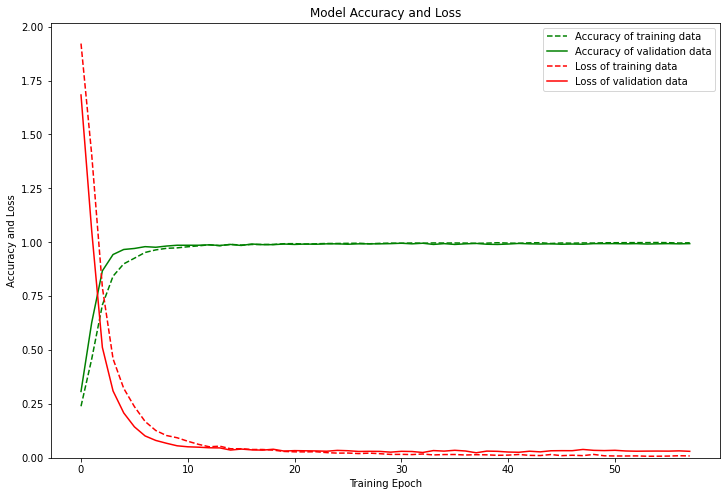

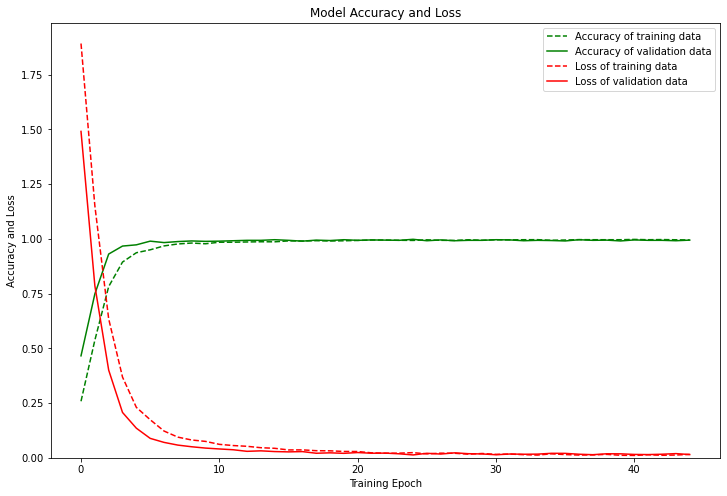

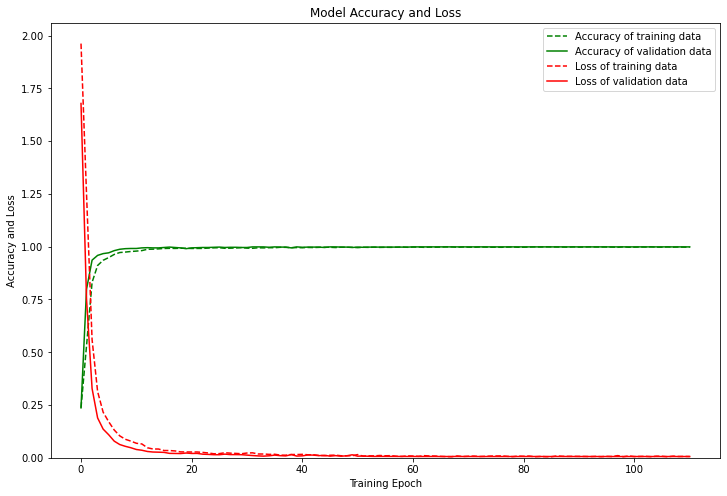

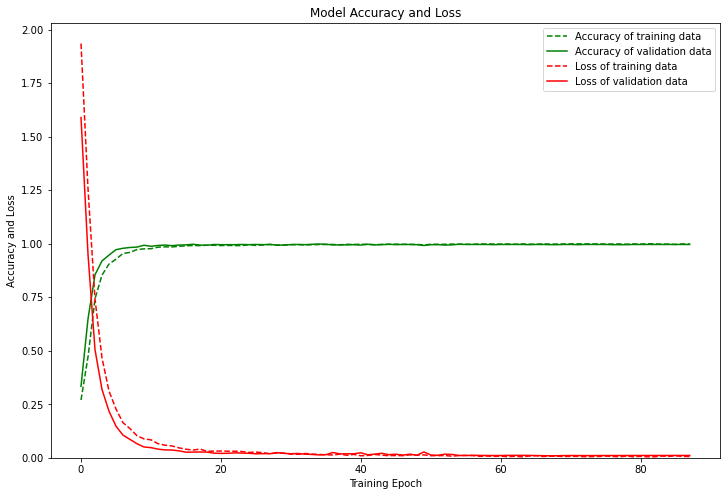

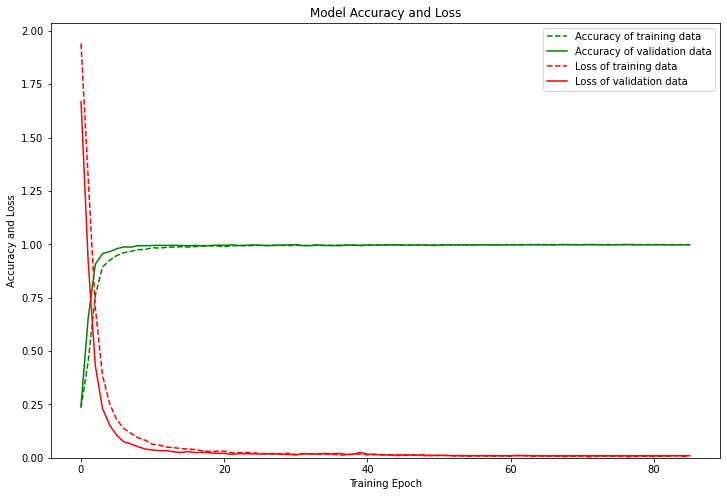

In [30]:
for history in train_histories:
    plt.figure(figsize=(12, 8))
    plt.plot(history['accuracy'], "g--", label="Accuracy of training data")
    plt.plot(history['val_accuracy'], "g", label="Accuracy of validation data")
    plt.plot(history['loss'], "r--", label="Loss of training data")
    plt.plot(history['val_loss'], "r", label="Loss of validation data")
    plt.title('Model Accuracy and Loss')
    plt.ylabel('Accuracy and Loss')
    plt.xlabel('Training Epoch')
    plt.ylim(0)
    plt.legend()
    plt.show()